In [ ]:
import os
import sys
sys.path.append(os.path.abspath("/home/users/zhiyi/PROJECTS_ANALYSIS"))
os.environ['PROJ_LIB'] = '/home/users/zhiyi/.conda/envs/plot_musica/share/proj'

from glob import glob

from matplotlib import pyplot as plt
import xarray as xr
import numpy as np
import cartopy.crs as ccrs
from matplotlib.font_manager import FontProperties
from matplotlib.ticker import AutoMinorLocator
from matplotlib.patches import Rectangle
from matplotlib.ticker import FuncFormatter
from zhiyi.plot.Plot_2D import Plot_2D
import netCDF4 as nc
import pandas as pd

print('done')


In [ ]:
scrip_filename = "/home/users/zhiyi/MUSICA_GRIDS/ne0np4.UK_ne30x16/grids/UK_ne30x16_np4_SCRIP.nc"
obs_filename = "/home/users/zhiyi/PROJECTS_ANALYSIS/extract_data/project_analysis/aurn_observation/PM25/pm2.5_filtered.csv"

season_configs = [
    {
        "name": "DJF",
        "months": ["2018-12", "2018-01", "2018-02"],
        "nobb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.1_NOBB/atm/hist/MUSICA_production3.1_NOBB.cam.h4.2017-12.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-01.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-02.nc",
        ],
        "bb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.1_BB/atm/hist/MUSICA_production3.1_BB.cam.h4.2017-12.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-01.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-02.nc",
        ],
    },
    {
        "name": "MAM",
        "months": ["2018-03", "2018-04", "2018-05"],
        "nobb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-03.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-04.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-05.nc",
        ],
        "bb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-03.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-04.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-05.nc",
        ],
    },
    {
        "name": "JJA",
        "months": ["2018-06", "2018-07", "2018-08"],
        "nobb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-06.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-07.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-08.nc",
        ],
        "bb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-06.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-07.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-08.nc",
        ],
    },
    {
        "name": "SON",
        "months": ["2018-09", "2018-10", "2018-11"],
        "nobb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-09.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-10.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0_NOBB/atm/hist/MUSICA_production3.0_NOBB.cam.h4.2018-11.nc",
        ],
        "bb_files": [
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-09.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-10.nc",
            "/home/users/zhiyi/duicv/ZHIYI_SOO/P_1/MUSICA_production3.0/atm/hist/MUSICA_production3.0.cam.h4.2018-11.nc",
        ],
    },
]

column_titles = [
    r'NOBB_ne30$\times$16',
    r'BB_ne30$\times$16',
    'Fractional Enhancement',
    'BB EMIS Impact',
]
letters = list('abcdefghijklmnop')


def lon_formatter(x, pos=None):
    if x == 0:
        return "0°"
    elif x > 0:
        return f"{x:.0f}°E"
    else:
        return f"{abs(x):.1f}°W"


def lat_formatter(y, pos=None):
    if y == 0:
        return "0°"
    elif y > 0:
        return f"{y:.1f}°N"
    else:
        return f"{abs(y):.1f}°S"


def seasonal_average(file_paths):
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined = xr.concat(datasets, dim="time")
    return combined.mean(dim="time")


def obs_for_months(months):
    df = pd.read_csv(obs_filename, skiprows=1)
    latobs = df['Latitude'].values
    lonobs = df['Longitude'].values + 360

    selected_cols = []
    for m in months:
        selected_cols.extend([col for col in df.columns if str(col).startswith(m)])

    valobs = df[selected_cols].mean(axis=1).values
    color_arr = valobs / 16
    color_arr[color_arr > 1] = 1
    return latobs, lonobs, color_arr


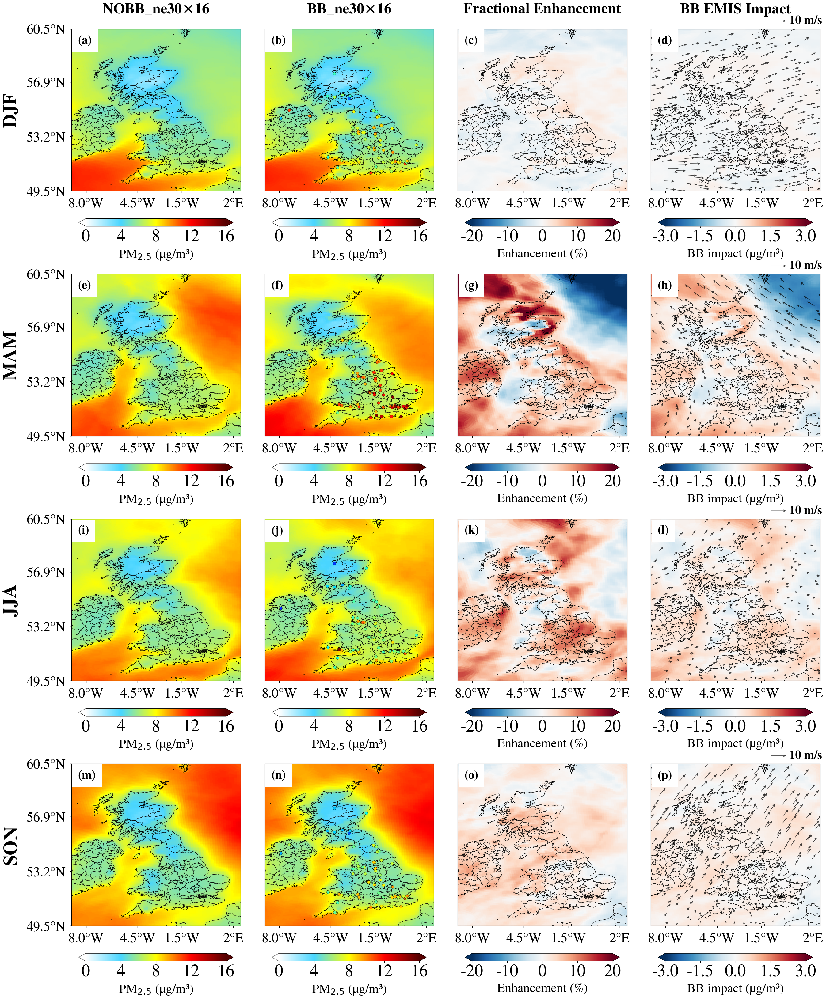

In [61]:
with nc.Dataset(scrip_filename) as f:
    lon_scrip = f.variables['grid_center_lon'][:]
    lat_scrip = f.variables['grid_center_lat'][:]

step = 60
lon_plot = lon_scrip[::step]
lat_plot = lat_scrip[::step]

fig, axs = plt.subplots(
    4, 4,
    figsize=(30, 34),
    subplot_kw={'projection': ccrs.PlateCarree()},
)

for row, season in enumerate(season_configs):
    average_data_NOBB = seasonal_average(season['nobb_files'])
    average_data_BB = seasonal_average(season['bb_files'])

    latobs, lonobs, color_arr = obs_for_months(season['months'])

    pm25_data_NOBB = average_data_NOBB['PM25'].isel(lev=-1) * 1e9
    pm25_data_BB = average_data_BB['PM25'].isel(lev=-1) * 1e9
    pm25_data_rel = (pm25_data_BB - pm25_data_NOBB) / pm25_data_NOBB * 100
    pm25_data_diff = pm25_data_BB - pm25_data_NOBB

    plot_settings = [
        (pm25_data_NOBB, column_titles[0] if row == 0 else '', 0, 16, 'PM$_{2.5}$ (µg/m³)'),
        (pm25_data_BB, column_titles[1] if row == 0 else '', 0, 16, 'PM$_{2.5}$ (µg/m³)'),
        (pm25_data_rel, column_titles[2] if row == 0 else '', -20, 20, 'Enhancement (%)'),
        (pm25_data_diff, column_titles[3] if row == 0 else '', -3, 3, 'BB impact (µg/m³)'),
    ]

    u_plot = average_data_BB['U'].isel(lev=-1).values[::step]
    v_plot = average_data_BB['V'].isel(lev=-1).values[::step]

    for col, (data, title, vmin, vmax, unit) in enumerate(plot_settings):
        ax = axs[row, col]
        p = Plot_2D(
            data,
            scrip_file=scrip_filename, pretty_tick=True,
            lon_range=[-9, 2.5],
            lat_range=[49.5, 60.5],
            lon_interval=2,
            lat_interval=2,
            resolution="10m",
            country=True, state=True, title=title,
            title_bold=True, unit='',
            nticks=5,
            title_size=30,
            label_size=22,
            cmax=vmax, cmin=vmin,
            lonlat_line=False,
            shrink=0.58,
            pad=0.13,
            fraction=0.11,
            extend='both',
            cmap=plt.colormaps['RdBu_r'] if col == 2 or col == 3 else None,
            unit_offset=[0.05, 0],
            ax=ax,
        )

        if hasattr(p, 'cb'):
            p.cb.ax.tick_params(labelsize=40)
            p.cb.ax.xaxis.set_label_position('bottom')
            p.cb.set_label(unit, fontsize=30, labelpad=8)

        if col == 1:
            cmap = plt.colormaps['jet']
            for j in range(np.size(latobs)):
                ax.plot(
                    lonobs[j], latobs[j],
                    linestyle='none', marker="o", markersize=7,
                    c=cmap(color_arr[j]),
                    markeredgecolor="black", markeredgewidth=0.4,
                    transform=ccrs.PlateCarree())

        font_prop = FontProperties(size=28, weight='bold')
        if col == 3:
            q = ax.quiver(
                lon_plot, lat_plot, u_plot, v_plot,
                scale=110, color='k', width=0.003, alpha=0.75,
                headaxislength=5, headwidth=5, headlength=6,
                transform=ccrs.PlateCarree())

            ax.quiverkey(q, X=0.8, Y=1.05, U=10, label='10 m/s',
                         labelpos='E', coordinates='axes',
                         fontproperties=font_prop)

        if col == 0:
            ax.set_ylabel(
                season['name'],
                fontsize=45, labelpad=15, weight='bold'
            )
            ax.set_yticks([], minor=False)
            ax.set_yticks(np.array([49.5, 53.2, 56.9, 60.5]), minor=True)

            ax.tick_params(axis='y', which='major', left=False, right=False, labelleft=False, labelright=False)
            ax.tick_params(axis='y', which='minor', labelsize=32, pad=9, length=4, width=1, left=True, right=False, labelleft=True, labelright=False)
        else:
            ax.set_ylabel("")
            ax.yaxis.set_tick_params(which='both', labelleft=False, labelright=False, left=False, right=False)

        ax.set_xlabel("", fontsize=18)
        ax.set_xticks([], minor=False)
        ax.set_xticks(np.array([-8, -4.5, -1.5, 2]), minor=True)

        ax.tick_params(axis='x', which='major', bottom=False, top=False, labelbottom=False)
        ax.tick_params(axis='x', which='minor', labelsize=32, pad=12, length=4, width=1, bottom=True, top=False, labelbottom=True)

        ax.xaxis.set_minor_formatter(FuncFormatter(lon_formatter))
        ax.yaxis.set_minor_formatter(FuncFormatter(lat_formatter))

        letter = letters[row * 4 + col]
        ax.text(
            0.040, 0.96,
            f'({letter})', transform=ax.transAxes,
            fontsize=28, va='top',
            ha='left', weight='bold',
            bbox=dict(facecolor='white', edgecolor='none', boxstyle='square, pad=0.5', alpha=1))

fig.subplots_adjust(left=0.065, right=0.985, top=0.955, bottom=0.045, wspace=-0.275, hspace=0.15)
for ax in axs.flat:
    ax.set_title(ax.get_title(), fontsize=35, weight='bold', pad=37)


In [ ]:
figure_data_dir = "/home/users/zhiyi/PROJECTS_ANALYSIS/P1_notebooks_revision/figure_data"
figure6_nc = os.path.join(figure_data_dir, "Figure6.nc")
os.makedirs(figure_data_dir, exist_ok=True)

pm25_nobb_all = []
pm25_bb_all = []
pm25_rel_all = []
pm25_diff_all = []
u_all = []
v_all = []
obs_color_all = []
obs_lat = None
obs_lon = None

for season in season_configs:
    average_data_NOBB = seasonal_average(season['nobb_files'])
    average_data_BB = seasonal_average(season['bb_files'])

    pm25_data_NOBB = average_data_NOBB['PM25'].isel(lev=-1) * 1e9
    pm25_data_BB = average_data_BB['PM25'].isel(lev=-1) * 1e9
    pm25_data_rel = (pm25_data_BB - pm25_data_NOBB) / pm25_data_NOBB * 100
    pm25_data_diff = pm25_data_BB - pm25_data_NOBB
    latobs, lonobs, color_arr = obs_for_months(season['months'])

    pm25_nobb_all.append(pm25_data_NOBB.values)
    pm25_bb_all.append(pm25_data_BB.values)
    pm25_rel_all.append(pm25_data_rel.values)
    pm25_diff_all.append(pm25_data_diff.values)
    u_all.append(average_data_BB['U'].isel(lev=-1).values)
    v_all.append(average_data_BB['V'].isel(lev=-1).values)
    obs_color_all.append(color_arr)

    if obs_lat is None:
        obs_lat = latobs
        obs_lon = lonobs

with xr.open_dataset(scrip_filename) as grid:
    figure6_data = xr.Dataset(
        data_vars={
            "pm25_nobb": (("season", "ncol"), np.asarray(pm25_nobb_all, dtype=np.float64)),
            "pm25_bb": (("season", "ncol"), np.asarray(pm25_bb_all, dtype=np.float64)),
            "pm25_fractional_enhancement": (("season", "ncol"), np.asarray(pm25_rel_all, dtype=np.float64)),
            "pm25_bb_emis_impact": (("season", "ncol"), np.asarray(pm25_diff_all, dtype=np.float64)),
            "u": (("season", "ncol"), np.asarray(u_all, dtype=np.float64)),
            "v": (("season", "ncol"), np.asarray(v_all, dtype=np.float64)),
            "obs_color": (("season", "obs_site"), np.asarray(obs_color_all, dtype=np.float64)),
            "obs_lat": (("obs_site",), np.asarray(obs_lat, dtype=np.float64)),
            "obs_lon": (("obs_site",), np.asarray(obs_lon, dtype=np.float64)),
            "grid_center_lon": (("ncol",), grid["grid_center_lon"].values.astype(np.float64)),
            "grid_center_lat": (("ncol",), grid["grid_center_lat"].values.astype(np.float64)),
            "grid_corner_lon": (("ncol", "grid_corner"), grid["grid_corner_lon"].values.astype(np.float64)),
            "grid_corner_lat": (("ncol", "grid_corner"), grid["grid_corner_lat"].values.astype(np.float64)),
            "grid_area": (("ncol",), grid["grid_area"].values.astype(np.float64)),
        },
        coords={
            "season": [season["name"] for season in season_configs],
            "month": (("season", "month_index"), [season["months"] for season in season_configs]),
            "ncol": np.arange(grid["grid_center_lon"].size, dtype=np.int32),
            "grid_corner": np.arange(grid["grid_corner_lon"].shape[1], dtype=np.int32),
            "obs_site": np.arange(len(obs_lat), dtype=np.int32),
        },
    )

for name in list(figure6_data.data_vars) + list(figure6_data.coords):
    figure6_data[name].attrs = {}
figure6_data.attrs = {}

figure6_data.to_netcdf(figure6_nc)
figure6_data.close()
figure6_nc


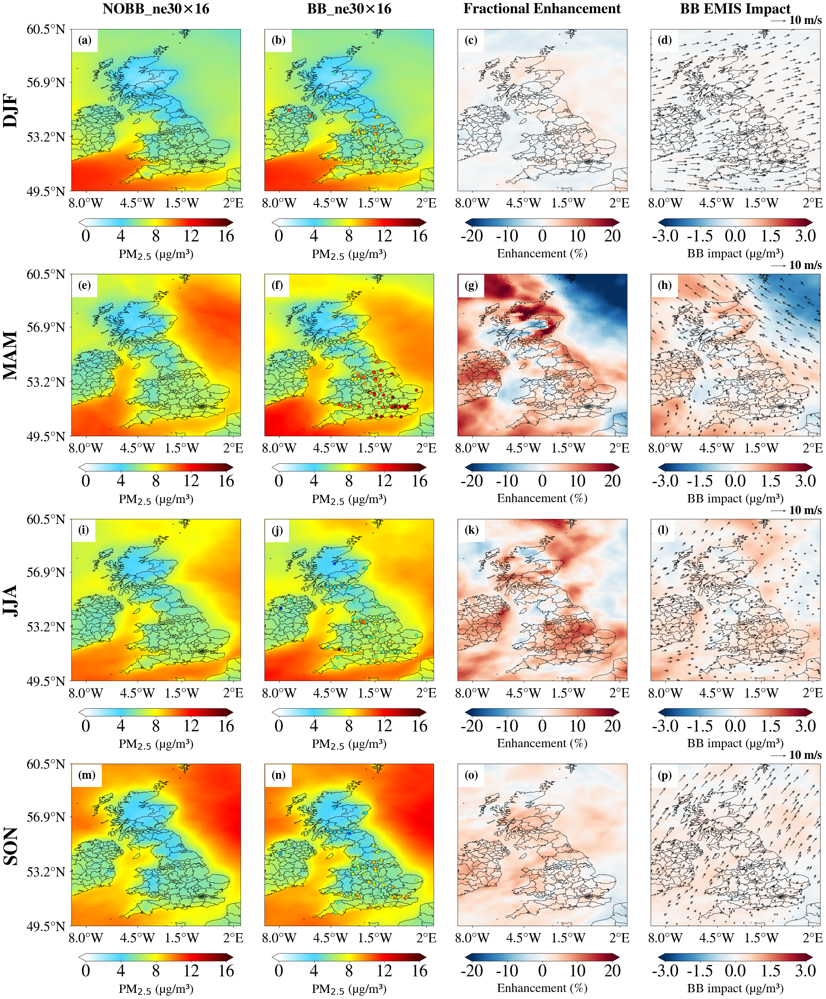

In [60]:
figure6_nc = "/home/users/zhiyi/PROJECTS_ANALYSIS/P1_notebooks_revision/figure_data/Figure6.nc"
figure6_saved = xr.open_dataset(figure6_nc)

scrip_saved = xr.Dataset(
    data_vars={
        "grid_center_lon": (("ncol",), figure6_saved["grid_center_lon"].values),
        "grid_center_lat": (("ncol",), figure6_saved["grid_center_lat"].values),
        "grid_corner_lon": (("ncol", "grid_corner"), figure6_saved["grid_corner_lon"].values),
        "grid_corner_lat": (("ncol", "grid_corner"), figure6_saved["grid_corner_lat"].values),
        "grid_area": (("ncol",), figure6_saved["grid_area"].values),
    }
)

step = 60
lon_plot = figure6_saved["grid_center_lon"].values[::step]
lat_plot = figure6_saved["grid_center_lat"].values[::step]

fig, axs = plt.subplots(
    4, 4,
    figsize=(30, 34),
    subplot_kw={'projection': ccrs.PlateCarree()},
)

for row, season_name in enumerate(figure6_saved["season"].values):
    latobs = figure6_saved["obs_lat"].values
    lonobs = figure6_saved["obs_lon"].values
    color_arr = figure6_saved["obs_color"].isel(season=row).values

    plot_settings = [
        (xr.DataArray(figure6_saved["pm25_nobb"].isel(season=row).values, dims=["ncol"]), column_titles[0] if row == 0 else '', 0, 16, 'PM$_{2.5}$ (µg/m³)'),
        (xr.DataArray(figure6_saved["pm25_bb"].isel(season=row).values, dims=["ncol"]), column_titles[1] if row == 0 else '', 0, 16, 'PM$_{2.5}$ (µg/m³)'),
        (xr.DataArray(figure6_saved["pm25_fractional_enhancement"].isel(season=row).values, dims=["ncol"]), column_titles[2] if row == 0 else '', -20, 20, 'Enhancement (%)'),
        (xr.DataArray(figure6_saved["pm25_bb_emis_impact"].isel(season=row).values, dims=["ncol"]), column_titles[3] if row == 0 else '', -3, 3, 'BB impact (µg/m³)'),
    ]

    u_plot = figure6_saved["u"].isel(season=row).values[::step]
    v_plot = figure6_saved["v"].isel(season=row).values[::step]

    for col, (data, title, vmin, vmax, unit) in enumerate(plot_settings):
        ax = axs[row, col]
        p = Plot_2D(
            data,
            scrip_file=scrip_saved, pretty_tick=True,
            lon_range=[-9, 2.5],
            lat_range=[49.5, 60.5],
            lon_interval=2,
            lat_interval=2,
            resolution="10m",
            country=True, state=True, title=title,
            title_bold=True, unit='',
            nticks=5,
            title_size=30,
            label_size=22,
            cmax=vmax, cmin=vmin,
            lonlat_line=False,
            shrink=0.58,
            pad=0.13,
            fraction=0.11,
            extend='both',
            cmap=plt.colormaps['RdBu_r'] if col == 2 or col == 3 else None,
            unit_offset=[0.05, 0],
            ax=ax,
        )

        if hasattr(p, 'cb'):
            p.cb.ax.tick_params(labelsize=40)
            p.cb.ax.xaxis.set_label_position('bottom')
            p.cb.set_label(unit, fontsize=30, labelpad=8)

        if col == 1:
            cmap = plt.colormaps['jet']
            for j in range(np.size(latobs)):
                ax.plot(
                    lonobs[j], latobs[j],
                    linestyle='none', marker="o", markersize=7,
                    c=cmap(color_arr[j]),
                    markeredgecolor="black", markeredgewidth=0.4,
                    transform=ccrs.PlateCarree())

        font_prop = FontProperties(size=28, weight='bold')
        if col == 3:
            q = ax.quiver(
                lon_plot, lat_plot, u_plot, v_plot,
                scale=110, color='k', width=0.003, alpha=0.75,
                headaxislength=5, headwidth=5, headlength=6,
                transform=ccrs.PlateCarree())

            ax.quiverkey(q, X=0.8, Y=1.05, U=10, label='10 m/s',
                         labelpos='E', coordinates='axes',
                         fontproperties=font_prop)

        if col == 0:
            ax.set_ylabel(
                str(season_name),
                fontsize=45, labelpad=15, weight='bold'
            )
            ax.set_yticks([], minor=False)
            ax.set_yticks(np.array([49.5, 53.2, 56.9, 60.5]), minor=True)

            ax.tick_params(axis='y', which='major', left=False, right=False, labelleft=False, labelright=False)
            ax.tick_params(axis='y', which='minor', labelsize=32, pad=9, length=4, width=1, left=True, right=False, labelleft=True, labelright=False)
        else:
            ax.set_ylabel("")
            ax.yaxis.set_tick_params(which='both', labelleft=False, labelright=False, left=False, right=False)

        ax.set_xlabel("", fontsize=18)
        ax.set_xticks([], minor=False)
        ax.set_xticks(np.array([-8, -4.5, -1.5, 2]), minor=True)

        ax.tick_params(axis='x', which='major', bottom=False, top=False, labelbottom=False)
        ax.tick_params(axis='x', which='minor', labelsize=32, pad=12, length=4, width=1, bottom=True, top=False, labelbottom=True)

        ax.xaxis.set_minor_formatter(FuncFormatter(lon_formatter))
        ax.yaxis.set_minor_formatter(FuncFormatter(lat_formatter))

        letter = letters[row * 4 + col]
        ax.text(
            0.040, 0.96,
            f'({letter})', transform=ax.transAxes,
            fontsize=28, va='top',
            ha='left', weight='bold',
            bbox=dict(facecolor='white', edgecolor='none', boxstyle='square, pad=0.5', alpha=1))

fig.subplots_adjust(left=0.065, right=0.985, top=0.955, bottom=0.045, wspace=-0.275, hspace=0.15)
for ax in axs.flat:
    ax.set_title(ax.get_title(), fontsize=35, weight='bold', pad=37)


# from pathlib import Path

# FIGURES_DIR = Path("/home/users/zhiyi/PROJECTS_ANALYSIS/P1_notebooks_revision/figures")
# FIGURES_DIR.mkdir(parents=True, exist_ok=True)

# RASTER_DPI = 300
# png_path = FIGURES_DIR / "Figure6.png"
# pdf_path = FIGURES_DIR / "Figure6.pdf"

# fig.savefig(png_path, dpi=RASTER_DPI, bbox_inches="tight", facecolor="white")

# img = plt.imread(png_path)
# height_px, width_px = img.shape[:2]
# pdf_fig = plt.figure(figsize=(width_px / RASTER_DPI, height_px / RASTER_DPI), dpi=RASTER_DPI)
# pdf_ax = pdf_fig.add_axes([0, 0, 1, 1])
# pdf_ax.imshow(img)
# pdf_ax.axis("off")
# pdf_fig.savefig(pdf_path, format="pdf", dpi=RASTER_DPI, bbox_inches=None, pad_inches=0, facecolor="white")
# plt.close(pdf_fig)
